# Project 6: Working with Geocoded Data

## Building Maps in _geopandas_

In this lesson we will download COVID-19 data from data.world. We will normalize the data to compare spread between counties. Were we to simply plot the total number of cases or deaths by county, the results would be biased as counties with larger populations would likely have more cases and more deaths. We will observe how the spread developed across the country, starting in the northeast, eventually making its way to other regions.

### Installing geopandas

Although there is a geopandas installation available using the *conda install* command in you command line shell, that package is incomplete for our purposes. We will need to install dependencies - in this order: *GDAL*,*Fiona*, and *Shapely* - for geopandas before installing geopandas. I have included the *.whl* files for each of these packages in the same folder is this notebook. Download the files and save them to your local folder. To install, use  the command:

> *pip install filename*

If you are using a machine for which you are not the administrator, use the command:

> *pip install filename --user*

Install the libraries using these commands from an administrator shell or using --user at the end of the statement: 

>*pip install GDAL-3.1.4-cp37-cp37m-win_amd64.whl*

>*pip install Fiona-1.8.17-cp37-cp37m-win_amd64.whl*

>*pip install Shapely-1.7.1-cp37-cp37m-win_amd64.whl*

If you are using Python 3.8, use the following wheels:

>*pip install GDAL-3.1.4-cp38-cp38-win_amd64.whl*

>*pip install Fiona-1.8.17-cp38-cp38-win_amd64.whl*

>*pip install Shapely-1.7.1-cp38-cp38-win_amd64.whl*

If you are using a mac, you may install the appropriate module by selecting the version.

> *pip install -v GDAL==3.1.4*

> *pip install -v Fiona==1.8.17*

> *pip install -v Shapely==1.7.1*

Finally, install geopandas:

> *pip install geopandas*

If the above methods do not work, try [installing through Anaconda](https://anaconda.org/conda-forge/geopandas) using the command:

> *conda install -c conda-forge geopandas*

### Downloading the COVID-19 data

We will use two datasets. First, we will import a shapefile to use with *geopandas*, which we will later use to generate a county level map that tracks COVID-19. The shapefile is provide for you in the Github folder housing this post. You can also download shapefiles from the U.S. Census [website](https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.html). We will download Johns Hopkins's COVID-19 data from the Associated Press's [account](https://data.world/associatedpress/johns-hopkins-coronavirus-case-tracker) at data.world using their [Python module](https://data.world/integrations/python). Follow [these instructions](https://github.com/datadotworld/data.world-py/) to install the  *datadotworld* module and access their API.

>*Datadotworld* may be useful efficiently collecting data for class projects, so keep this libary in mind as you make plans for your project.

First we will create the functions that download and import the data, then we will call these functions in the following cells.

In [1]:
import numpy as np
import pandas as pd
import geopandas
import datetime

import datadotworld as dw

def import_covid_data(FIPS_name):
    # Load COVID19 county data using datadotworld API
    # Data provided by John Hopkins, file provided 
    # by Associated Press
    dataset = dw.load_dataset(
        "associatedpress/johns-hopkins-coronavirus-case-tracker",
        auto_update = True)
    
    #the dataset includes multiple dataframes. We will only use #2
    covid_data = dataset.dataframes[
        "2_cases_and_deaths_by_county_timeseries"]
    covid_data = covid_data[covid_data[FIPS_name] < 57000]
    covid_data = covid_data[covid_data[FIPS_name] > 0]
    # Transform FIPS codes into integers
    covid_data[FIPS_name] = covid_data[FIPS_name].astype(int)
    covid_data.set_index([FIPS_name, "date"], inplace = True)
    
    # Prepare a column for state abbreviations. we will draw these 
    # from state_dict
    covid_data["state_abr"] = ""
    for state, abr in state_dict.items():
        #.loc[row(s), col]
        covid_data.loc[
            covid_data["state"] == state, "state_abr"] = abr
    # save location name as Cass, ND 
    covid_data["Location"] = covid_data["location_name"] + ", " +\
        covid_data["state_abr"]
    return covid_data

def import_geo_data(filename, index_col = "Date", 
                    FIPS_name = "FIPS"):
    # import county level shapefile
    map_data = geopandas.read_file(filename = filename, 
                                  index_col = index_col)
    map_data.rename(columns = {"State":"state"},
                   inplace = True)
    # Combine statefips and county fips to create a single fips value
    # that identifies each particular county without referencing the
    # state separately
    map_data[FIPS_name] = map_data["STATEFP"].astype(str) +\
        map_data["COUNTYFP"].astype(str)
    map_data[FIPS_name] = map_data[FIPS_name].astype(np.int64)
    map_data.set_index(FIPS_name, inplace = True)
    
    return map_data

state_dict = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ',
    'Arkansas': 'AR', 'California': 'CA', 'Colorado': 'CO',
    'Connecticut': 'CT', 
    'Delaware': 'DE', 'District of Columbia': 'DC', 'Florida': 'FL', 
    'Georgia': 'GA', 'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL',
    'Indiana': 'IN', 'Iowa': 'IA','Kansas': 'KS', 'Kentucky': 'KY',
    'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD', 
    'Massachusetts': 'MA',
    'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS', 
    'Missouri': 'MO',
    'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 
    'New Hampshire': 'NH',
    'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 
    'North Carolina': 'NC',
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK',
    'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI',
    'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX',
    'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA',
    'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 
    'Wyoming': 'WY'}


In [2]:
fips_name = "fips_code"
# rename_FIPS matches map_data FIPS with COVID19 FIPS name
covid_data = import_covid_data(FIPS_name = fips_name)

C:\Users\Shane\anaconda3\lib\site-packages\datadotworld\models\dataset.py:206: UserWarning: Unable to set data frame dtypes automatically using 2_cases_and_deaths_by_county_timeseries schema. Data types may need to be adjusted manually. Error: Integer column has NA values in column 2
  warnings.warn(


In [3]:
covid_data

uid location_type location_name    state  \
fips_code date                                                        
1001      2020-01-22  84001001        county       Autauga  Alabama   
          2020-01-23  84001001        county       Autauga  Alabama   
          2020-01-24  84001001        county       Autauga  Alabama   
          2020-01-25  84001001        county       Autauga  Alabama   
          2020-01-26  84001001        county       Autauga  Alabama   
...                        ...           ...           ...      ...   
56045     2020-11-09  84056045        county        Weston  Wyoming   
          2020-11-10  84056045        county        Weston  Wyoming   
          2020-11-11  84056045        county        Weston  Wyoming   
          2020-11-12  84056045        county        Weston  Wyoming   
          2020-11-13  84056045        county        Weston  Wyoming   

                      total_population  cumulative_cases  \
fips_code date                                             
1001      2020-01-22           55200.0                 0   
          2020-01-23           55200.0                 0   
          2020-01-24           55200.0                 0   
          2020-01-25           55200.0                 0   
          2020-01-26           55200.0                 0   
...                                ...               ...   
56045     2020-11-09            7100.0               310   
          2020-11-10            7100.0               321   
          2020-11-11            7100.0               323   
          2020-11-12            7100.0               321   
          2020-11-13            7100.0               330   

                      cumulative_cases_per_100_000  cumulative_deaths  \
fips_code date                                                          
1001      2020-01-22                          0.00                  0   
          2020-01-23                          0.00                  0   
          2020-01-24                          0.00                  0   
          2020-01-25                          0.00                  0   
          2020-01-26                          0.00                  0   
...                                            ...                ...   
56045     2020-11-09                       4366.20                  0   
          2020-11-10                       4521.13                  0   
          2020-11-11                       4549.30                  0   
          2020-11-12                       4521.13                  0   
          2020-11-13                       4647.89                  0   

                      cumulative_deaths_per_100_000  new_cases  new_deaths  \
fips_code date                                                               
1001      2020-01-22                            0.0        NaN         NaN   
          2020-01-23                            0.0        0.0         0.0   
          2020-01-24                            0.0        0.0         0.0   
          2020-01-25                            0.0        0.0         0.0   
          2020-01-26                            0.0        0.0         0.0   
...                                             ...        ...         ...   
56045     2020-11-09                            0.0        4.0         0.0   
          2020-11-10                            0.0       11.0         0.0   
          2020-11-11                            0.0        2.0         0.0   
          2020-11-12                            0.0       -2.0         0.0   
          2020-11-13                            0.0        9.0         0.0   

                      new_cases_per_100_000  new_deaths_per_100_000  \
fips_code date                                                        
1001      2020-01-22                    NaN                     NaN   
          2020-01-23                   0.00                     0.0   
          2020-01-24                   0.00                     0.0   
  

In [4]:
map_data = import_geo_data(
    filename = "countiesWithStatesAndPopulation.shp",
    index_col = "Date", FIPS_name= fips_name)

In [5]:
map_data

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,geometry
fips_code,,,,,,,,,,,
21007,21,007,00516850,0500000US21007,Ballard,06,639387454,69473325,7888.0,Kentucky,"POLYGON ((-89.18137 37.04630, -89.17938 37.053..."
21017,21,017,00516855,0500000US21017,Bourbon,06,750439351,4829777,19788.0,Kentucky,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
21031,21,031,00516862,0500000US21031,Butler,06,1103571974,13943044,12879.0,Kentucky,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
21065,21,065,00516879,0500000US21065,Estill,06,655509930,6516335,14106.0,Kentucky,"POLYGON ((-84.12662 37.64540, -84.12483 37.646..."
21069,21,069,00516881,0500000US21069,Fleming,06,902727151,7182793,14581.0,Kentucky,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."
...,...,...,...,...,...,...,...,...,...,...,...
31073,31,073,00835858,0500000US31073,Gosper,06,1186616237,11831826,1990.0,Nebraska,"POLYGON ((-100.09510 40.43866, -100.08937 40.4..."
39075,39,075,01074050,0500000US39075,Holmes,06,1094405866,3695230,43960.0,Ohio,"POLYGON ((-82.22066 40.66758, -82.19327 40.667..."
48171,48,171,01383871,0500000US48171,Gillespie,06,2740719114,9012764,26988.0,Texas,"POLYGON ((-99.30400 30.49983, -99.28234 30.499..."


The geodataframe holds the geometry of the goegraphic entity. In our case, this indicates the boundaries of the counties. Next, let's print the boundaries of Cass county using its FIPS, 38017. After that, we will call the value without print() to see the actual shape.

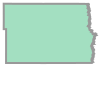

In [6]:
map_data.loc[38017, "geometry"]

We can plot all of the data at once using df.plot(). However, we will want to specify map parameters.

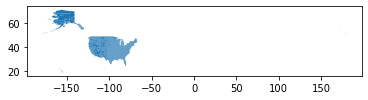

In [7]:
map_data.plot()

Now we will want to geocode the county level COVID-19 data. To do this, we will make a copy of the geodataframe for each date and merge that copy with the COVID-19 data for that date. Then, we will stack the dataframe for each date to create a geodataframe of the COVID-19 data.

In [ ]:
#COVID19Map.py
#. . . 
def create_merged_geo_dataframe(data, map_data, dates):
    data_frame_initialized = False
    # use groupby to generate a df with only the fips_code index
    # then save that index as the variable counties
    counties =data.groupby("fips_code").mean().index
    counties
    for date in dates:
        # select county observations from each date in dates
        # select only the subset of counties in the map that
        # are also present in the covid_data
        agg_df = map_data.loc[counties]
        agg_df["date"] = date
        if data_frame_initialized == False:
            #Create new dataframe
            matching_gpd = geopandas.GeoDataFrame(agg_df, crs = map_data.crs)
            data_frame_initialized = True        
        
        else:
            # or stack thenew  data frame and the dataframe that was initialized at
            # i = 0
            matching_gpd = matching_gpd.append(agg_df, ignore_index = False)
    # reset index, then set to [fips, date]
    matching_gpd.reset_index(inplace=True)
    matching_gpd.set_index(["fips_code", "date"], inplace = True)
    
    for key, val in data.items():
        matching_gpd[key] = val
    return matching_gpd
        
        
# . . . 
# create a list of dates
dates =covid_data.groupby("date").mean().index
covid_data = create_merged_geo_dataframe(covid_data, map_data, dates)

In [9]:
covid_data

,,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,...,cumulative_deaths,cumulative_deaths_per_100_000,new_cases,new_deaths,new_cases_per_100_000,new_deaths_per_100_000,new_cases_7_day_rolling_avg,new_deaths_7_day_rolling_avg,state_abr,Location
fips_code,date,,,,,,,,,,,,,,,,,,,,,
1001,2020-01-22,1,001,00161526,0500000US01001,Autauga,06,1539602123,25706961,55869.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Autauga, AL"
1003,2020-01-22,1,003,00161527,0500000US01003,Baldwin,06,4117546676,1133055836,223234.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Baldwin, AL"
1005,2020-01-22,1,005,00161528,0500000US01005,Barbour,06,2292144655,50538698,24686.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Barbour, AL"
1007,2020-01-22,1,007,00161529,0500000US01007,Bibb,06,1612167481,9602089,22394.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Bibb, AL"
1009,2020-01-22,1,009,00161530,0500000US01009,Blount,06,1670103911,15015423,57826.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Blount, AL"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56037,2020-11-13,56,037,01609192,0500000US56037,Sweetwater,06,27005754244,166230251,42343.0,Wyoming,...,4,9.07,47.0,0.0,106.53,0.0,44.29,0.00,WY,"Sweetwater, WY"
56039,2020-11-13,56,039,01605083,0500000US56039,Teton,06,10351784301,570864879,23464.0,Wyoming,...,2,8.67,42.0,0.0,182.14,0.0,26.57,0.00,WY,"Teton, WY"
56041,2020-11-13,56,041,01605084,0500000US56041,Uinta,06,5391631764,16625817,20226.0,Wyoming,...,4,19.41,22.0,0.0,106.75,0.0,20.57,0.14,WY,"Uinta, WY"


Next, let's transform the data from the level COVID-19 in each county to account for population. Then we will calculate the daily rate of new cases and deaths per million persons.

In [10]:
def create_new_vars(covid_data, moving_average_days):
    # use a for loop that performs the same operations for cases and deaths
    for key in ("cases", "deaths"):
        cap_key = key.title()
        covid_data[cap_key + " per Million"] = covid_data["cumulative_" + key]\
            .div(covid_data["total_population"]).mul(10**6)
        covid_data["Daily " + cap_key + " per Million"] =\
            covid_data["cumulative_"+key].groupby(covid_data.index.names[0])\
            .diff(1).div(covid_data["total_population"]).mul(10**6)
        covid_data["Daily " + cap_key + " per Million MA"] = covid_data["Daily " +\
                cap_key + " per Million"].rolling(moving_average_days).mean()        

moving_average_days = 7
create_new_vars(covid_data, moving_average_days)

In [11]:
covid_data

,,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,...,new_cases_7_day_rolling_avg,new_deaths_7_day_rolling_avg,state_abr,Location,Cases per Million,Daily Cases per Million,Daily Cases per Million MA,Deaths per Million,Daily Deaths per Million,Daily Deaths per Million MA
fips_code,date,,,,,,,,,,,,,,,,,,,,,
1001,2020-01-22,1,001,00161526,0500000US01001,Autauga,06,1539602123,25706961,55869.0,Alabama,...,NaN,NaN,AL,"Autauga, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1003,2020-01-22,1,003,00161527,0500000US01003,Baldwin,06,4117546676,1133055836,223234.0,Alabama,...,NaN,NaN,AL,"Baldwin, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1005,2020-01-22,1,005,00161528,0500000US01005,Barbour,06,2292144655,50538698,24686.0,Alabama,...,NaN,NaN,AL,"Barbour, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1007,2020-01-22,1,007,00161529,0500000US01007,Bibb,06,1612167481,9602089,22394.0,Alabama,...,NaN,NaN,AL,"Bibb, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1009,2020-01-22,1,009,00161530,0500000US01009,Blount,06,1670103911,15015423,57826.0,Alabama,...,NaN,NaN,AL,"Blount, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56037,2020-11-13,56,037,01609192,0500000US56037,Sweetwater,06,27005754244,166230251,42343.0,Wyoming,...,44.29,0.00,WY,"Sweetwater, WY",22462.996124,1065.348958,1146.041967,90.667996,0.0,0.0
56039,2020-11-13,56,039,01605083,0500000US56039,Teton,06,10351784301,570864879,23464.0,Wyoming,...,26.57,0.00,WY,"Teton, WY",48050.652674,1821.414632,1131.552863,86.734030,0.0,0.0
56041,2020-11-13,56,041,01605084,0500000US56041,Uinta,06,5391631764,16625817,20226.0,Wyoming,...,20.57,0.14,WY,"Uinta, WY",33286.428259,1067.494784,1167.338766,194.089961,0.0,0.0


Our data is more or less ready to plot. For the next step, we will not include Alaska or Hawaii so that the counties of the 48 states are visible. Thus, we will select the data within a limited range of coordinates. If you so wish, you could include these states in their own dataframe and plot them separately. 

In [12]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.ticker as mtick

# only select data that falls within bounds of coordinates
def select_data_within_bounds(data, minx, miny, maxx, maxy):
    data = data[data.bounds["maxx"] <= maxx]
    data = data[data.bounds["maxy"] <= maxy]
    data = data[data.bounds["minx"] >= minx]
    data = data[data.bounds["miny"] >= miny]
        
    return data

Finally we can plot the data. Let's start by plotting "Deaths per Million".

Text(0.5, 1.0, '2020-11-13\nCovid-19 in the U.S.')

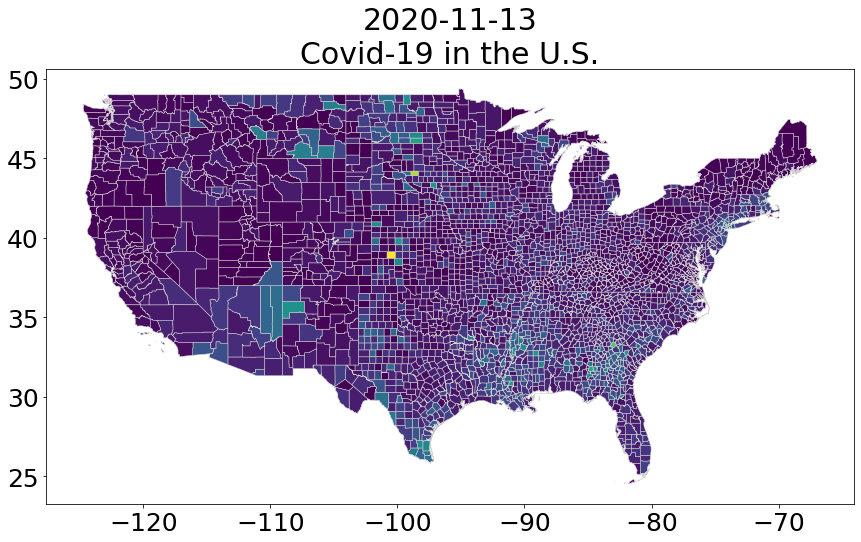

In [13]:
date = dates[-1]

# choose map bounds
if "covid_map_bounded" not in locals():
    minx = -127
    miny = 23
    maxx = -66
    maxy = 50
    covid_data = select_data_within_bounds(covid_data, minx, miny, maxx, maxy)
    covid_map_bounded = True
    
fig, ax = plt.subplots(figsize = (18, 8),
    subplot_kw = {"aspect":"equal"})
plt.rcParams.update({"font.size":30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Deaths per Million"
df = covid_data[covid_data.index.get_level_values("date") == date]
df.plot(ax = ax, cax = ax, column = key, linewidth = .5,
       edgecolor = "lightgrey")

ax.set_title(str(date) +"\nCovid-19 in the U.S.", fontsize = 30)

The color scheme is not ideal. We will want to change the colorbar to "Reds" and have the colorbar represent a range of _logged values_.

Text(0.5, 1.0, '2020-11-13\nCovid-19 in the U.S.')

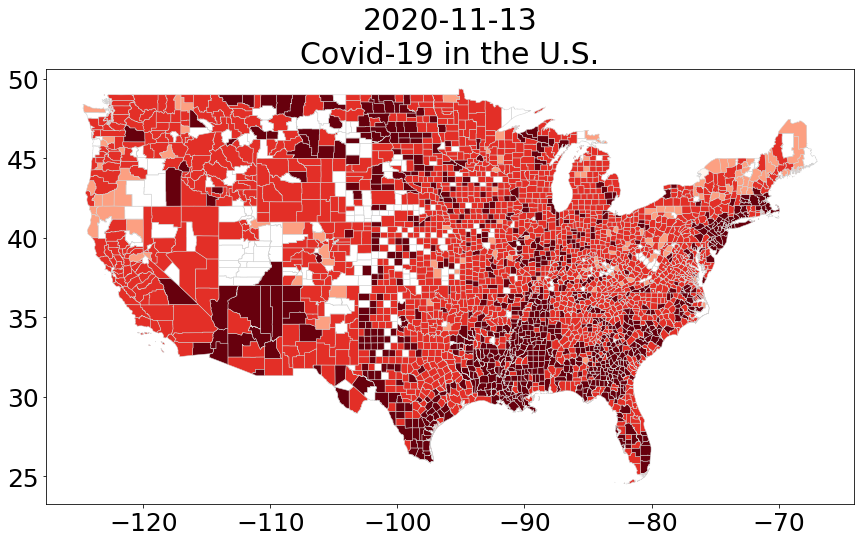

In [14]:
fig, ax = plt.subplots(figsize = (18, 8),
    subplot_kw = {"aspect":"equal"})
plt.rcParams.update({"font.size":30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Deaths per Million"
#change colors, divide into 4 distinct color
cmap = cm.get_cmap("Reds", 4)
vmin = 1
vmax = df[key].max()

# norm defines the range of the logged value
norm = cm.colors.LogNorm(vmin=vmin, vmax=vmax)
# ScalarMappable uses that range in the colorbar
plt.cm.ScalarMappable(cmap=cmap, norm=norm)

df = covid_data[covid_data.index.get_level_values("date") == date]
df.plot(ax = ax, cax = ax, column = key, linewidth = .5,
       edgecolor = "lightgrey", vmin=vmin, vmax=vmax,
       cmap = cmap, legend = False, norm = norm)

ax.set_title(str(date) +"\nCovid-19 in the U.S.", fontsize = 30)

Next, let's divide the figure so that you can place the colorbar on the right side of the figure.

Text(0.5, 1.0, '2020-11-13\nCOVID-19 in the U.S.')

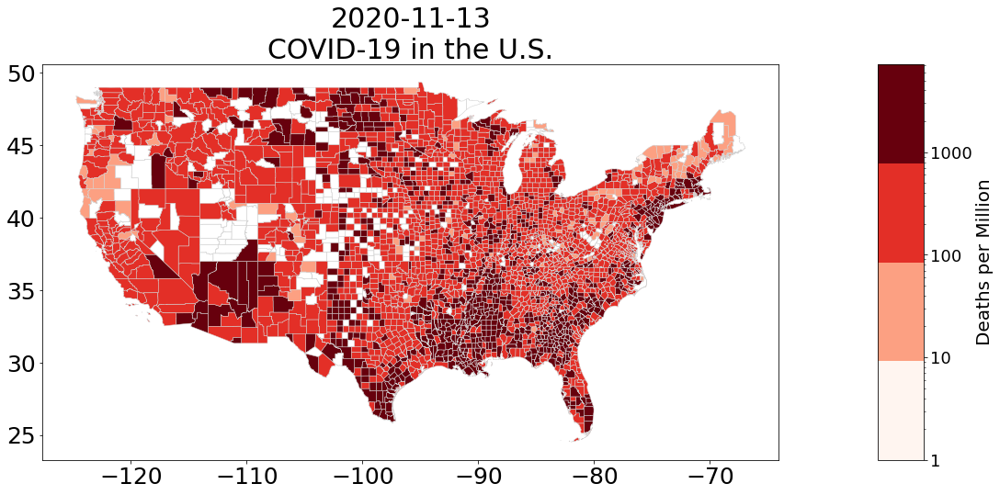

In [15]:
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as mtick


fig, ax = plt.subplots(figsize=(19,9),
                      subplot_kw = {"aspect":"equal"})
plt.rcParams.update({"font.size": 30})

plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Deaths per Million"
df = covid_data[covid_data.index.get_level_values("date") == date]
cmap = cm.get_cmap("Reds", 4)
vmin = 1
vmax = df[key].max()
norm = cm.colors.LogNorm(vmin=vmin, vmax=vmax)

### add colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
# empty array for the data range
sm.A = []
# prepare space for colorbar
divider = make_axes_locatable(ax)
size = "5%"
cax = divider.append_axes("right", size = size, pad = .1)
# add colorbar to figure
cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
cbar.ax.tick_params(labelsize=18)
vals = list(cbar.ax.get_yticks())
vals.append(vmax)
cbar.ax.set_yticklabels([int(x) for x in vals])
cbar.ax.set_ylabel(key, fontsize=20)

df.plot(ax=ax, cax=ax, column = key, vmin=vmin, vmax=vmax,
       cmap=cmap, legend=False, linewidth = .5, 
        edgecolor="lightgrey",norm=norm)
ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.",
             fontsize = 30)

Finally, let's plot all four variables for the last date in the range of dates covered by the data. Once we have set up the code to plot each variable, we need only add another for loop to iterate through the dates. To save on hard drive space, we will only plot one date per month. Save these in a pdf using _PdfPages_.

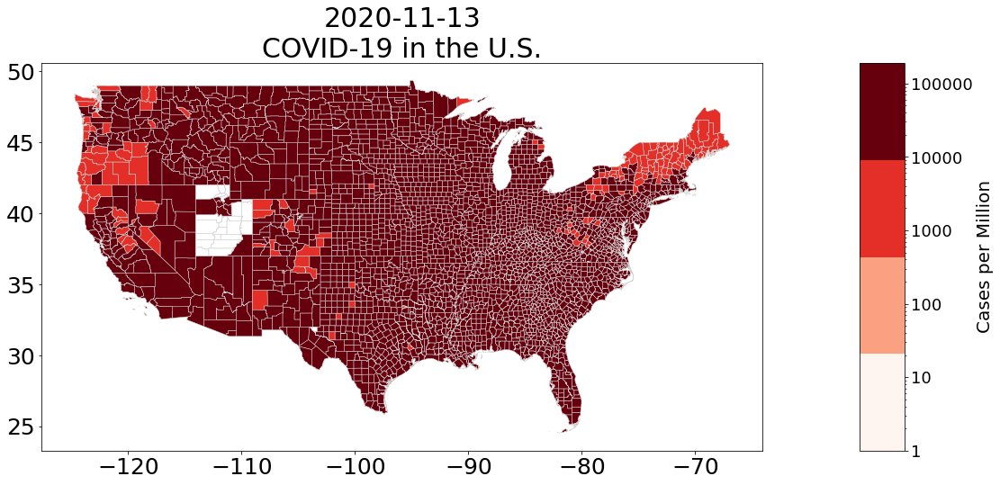

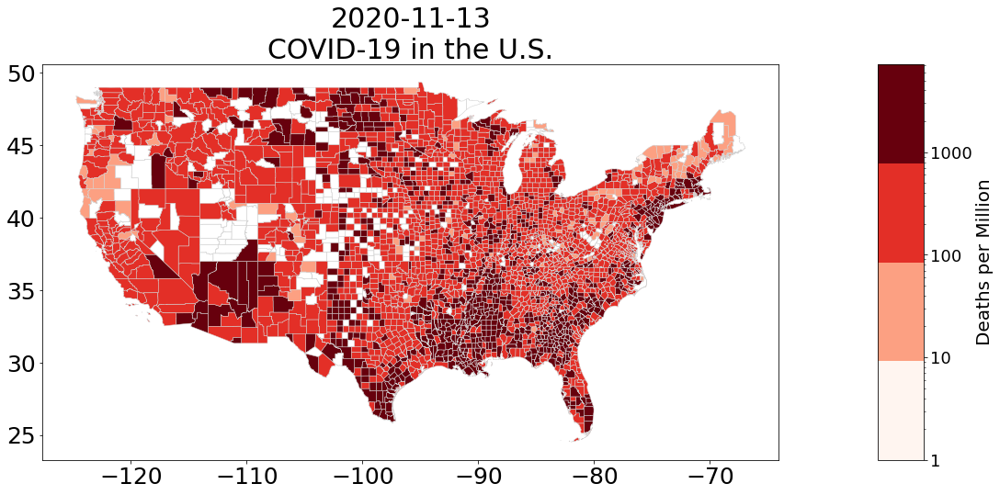

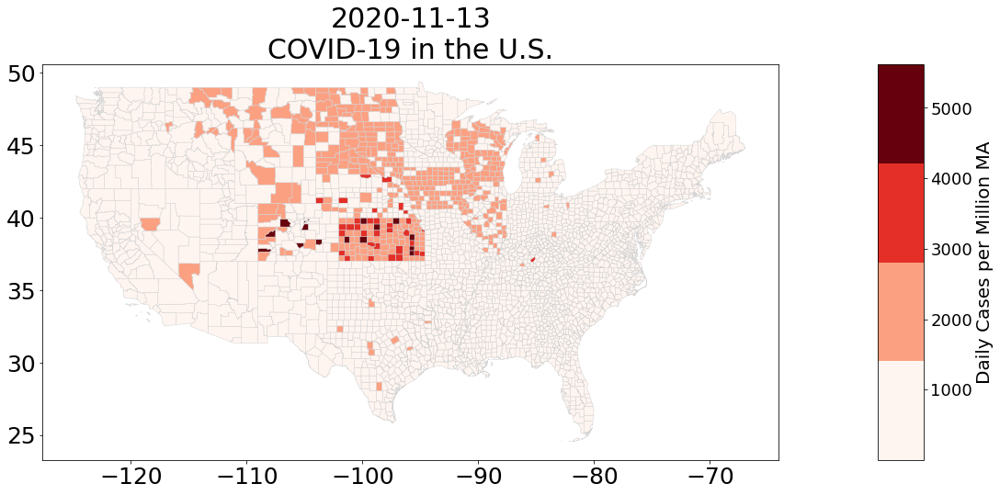

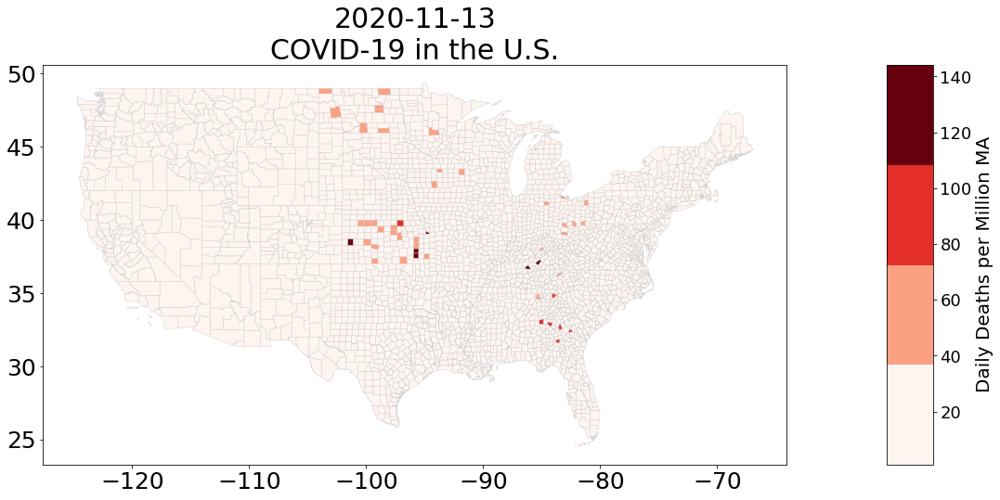

In [16]:
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as mtick

keys = ["Cases per Million", "Deaths per Million",
       "Daily Cases per Million MA", "Daily Deaths per Million MA"]

for key in keys:
    log = False if "Daily" in key else True
    fig, ax = plt.subplots(figsize=(19,9),
                          subplot_kw = {"aspect":"equal"})
    plt.rcParams.update({"font.size": 30})

    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    df = covid_data[covid_data.index.get_level_values("date") == date]
    cmap = cm.get_cmap("Reds", 4)
    vmin = 1
    vmax = df[key].max()
    if log:
        norm = cm.colors.LogNorm(vmin=vmin, vmax=vmax)
    else:
        norm = cm.colors.Normalize(vmin=vmin, vmax=vmax)
    ### add colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm.A = []
    # prepare space for colorbar
    divider = make_axes_locatable(ax)
    size = "5%"
    cax = divider.append_axes("right", size = size, pad = .1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    cbar.ax.set_yticklabels([int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize=20)

    df.plot(ax=ax, cax=ax, column = key, vmin=vmin, vmax=vmax,
           cmap=cmap, legend=False, linewidth = .5, 
            edgecolor="lightgrey",norm=norm)
    ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.",
                 fontsize = 30)
    plt.show()
    plt.close()

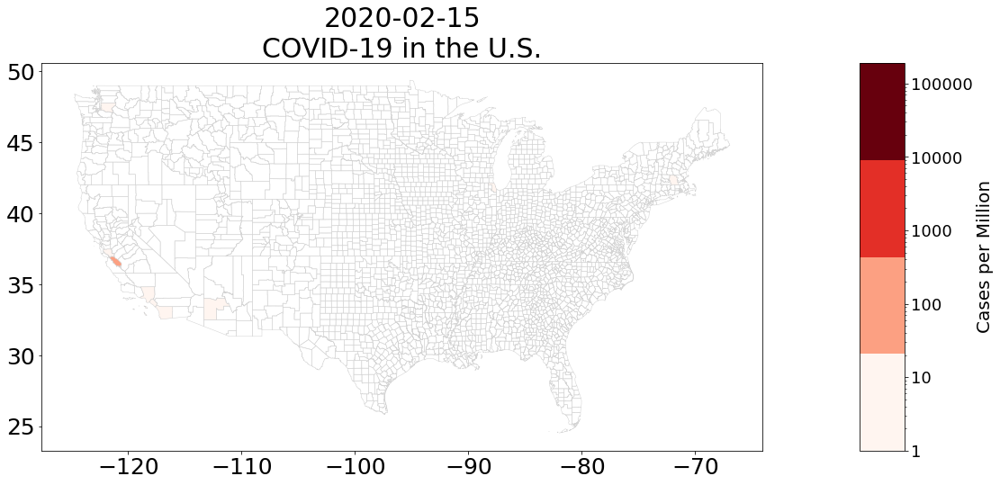

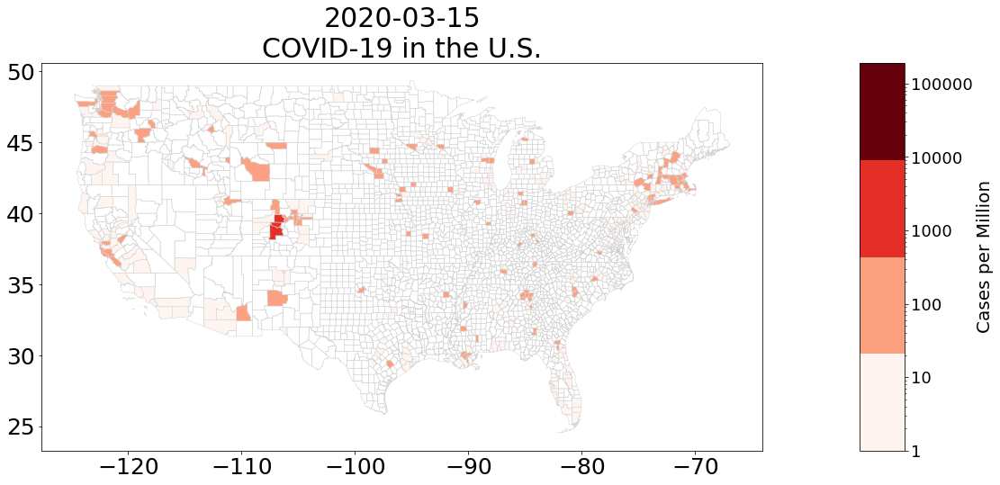

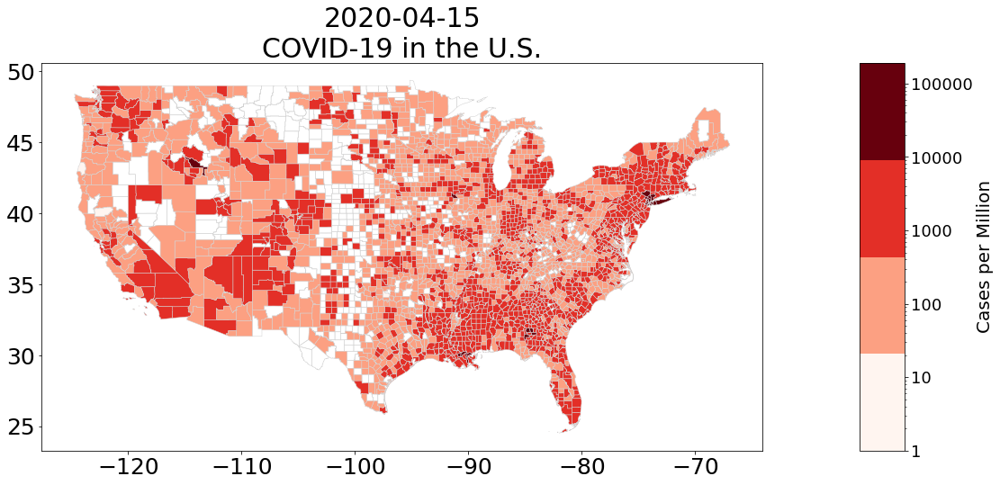

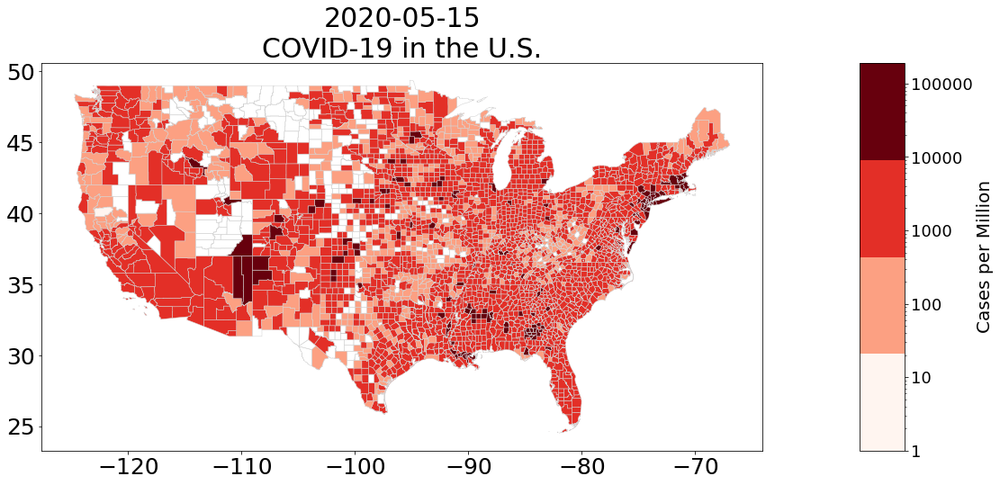

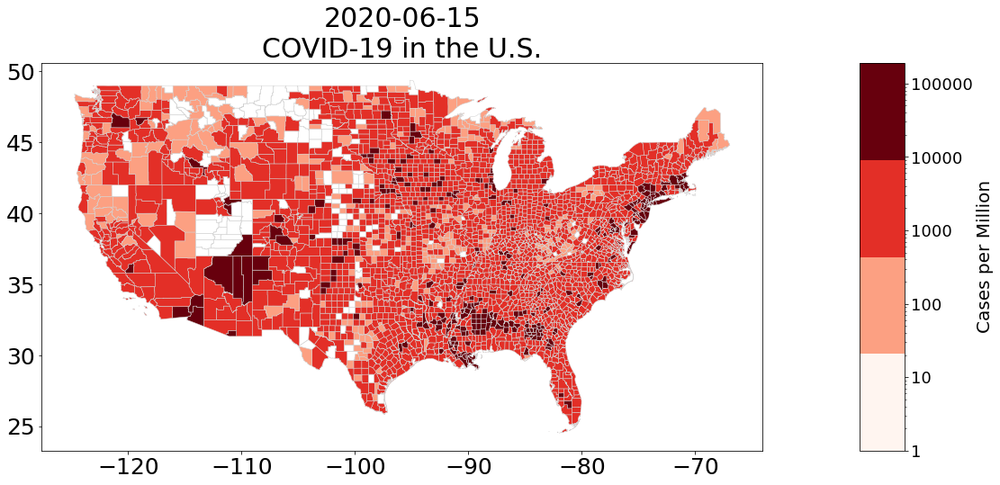

...

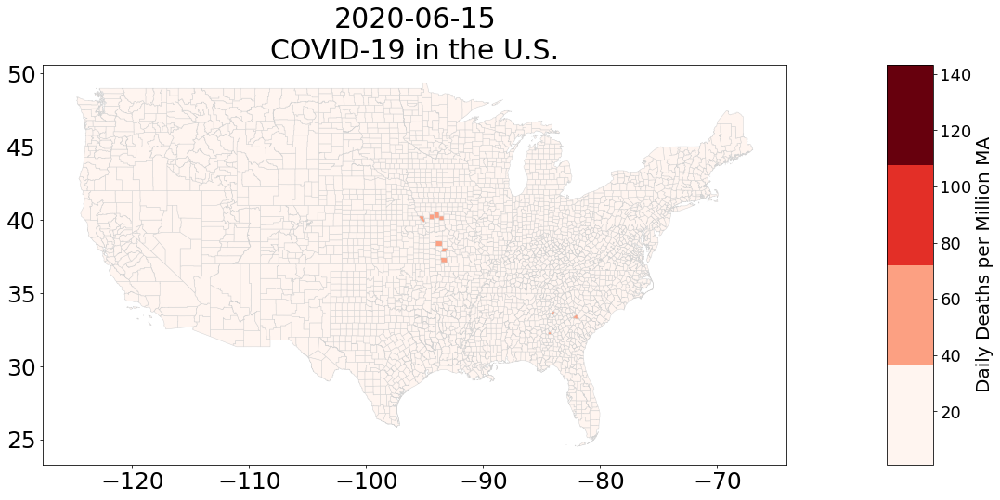

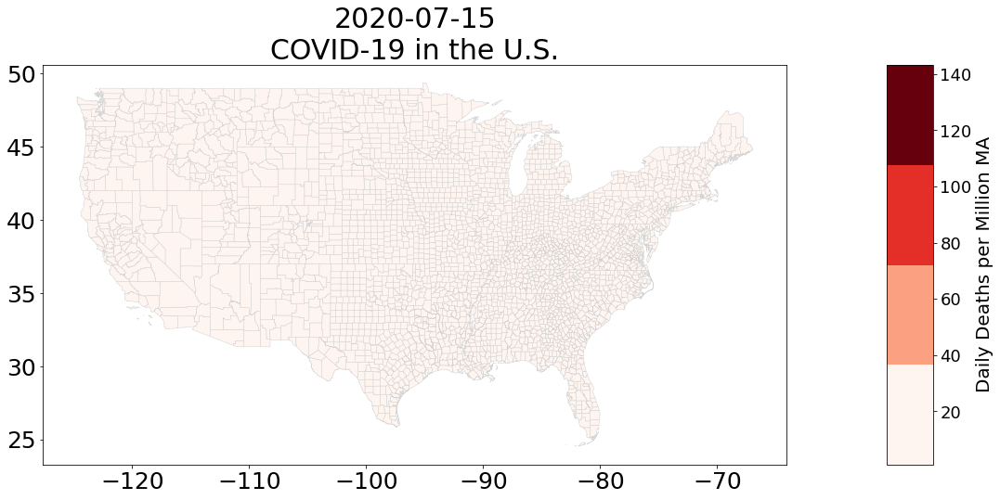

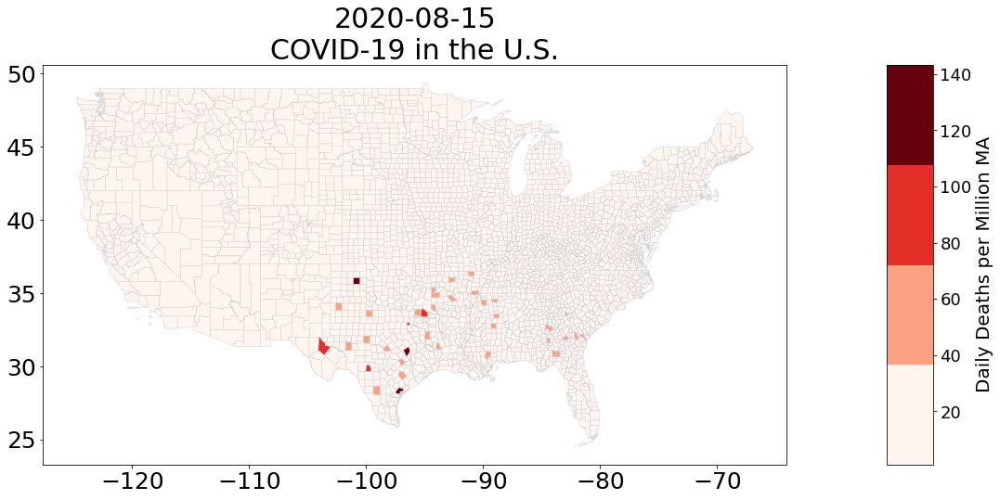

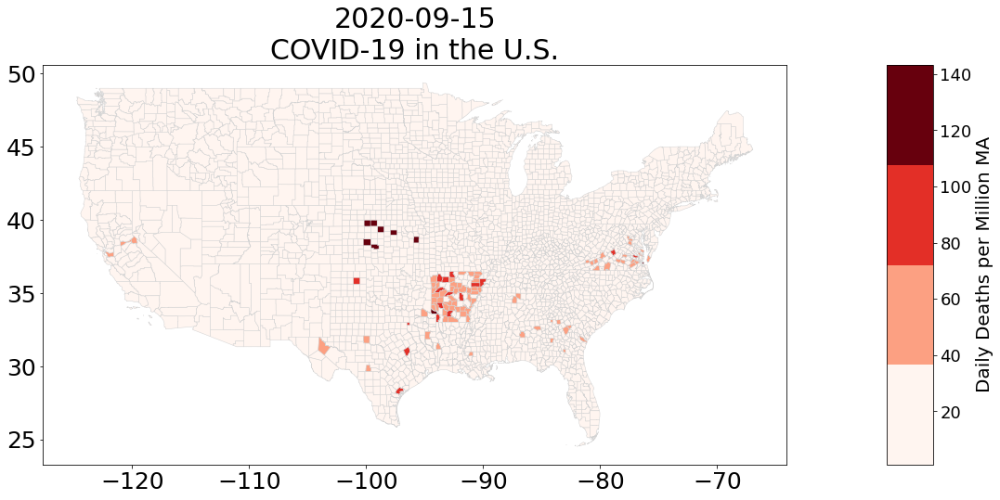

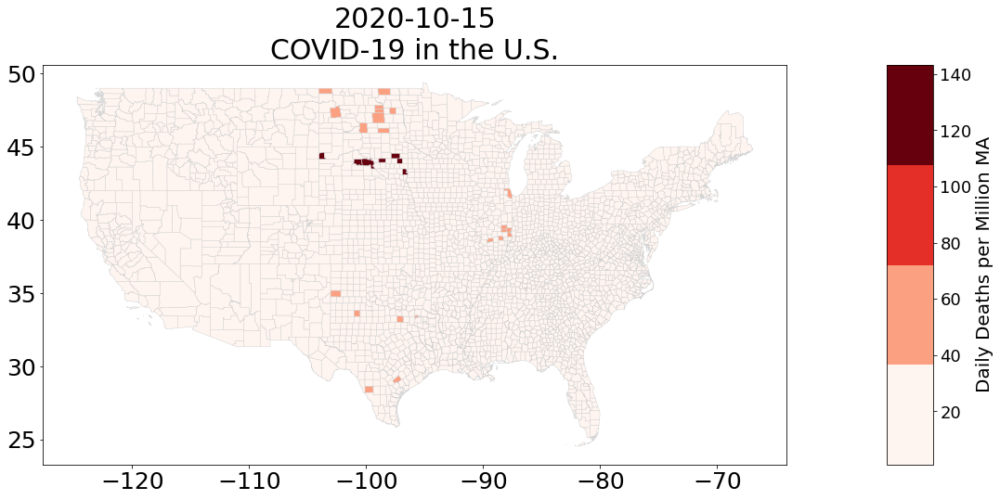

In [17]:
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as mtick
from matplotlib.backends.backend_pdf import PdfPages

# create empty pdf
pp = PdfPages("COVID-19Maps.pdf")

keys = ["Cases per Million", "Deaths per Million",
       "Daily Cases per Million MA", "Daily Deaths per Million MA"]

dates = covid_data.groupby("date").mean().index
# only include every 7th day,
# not required
dates = [date for date in dates if "15" in date]
for key in keys:
    vmin = 1
    vmax = df[key].max()

    for date in dates:
        log = False if "Daily" in key else True
        fig, ax = plt.subplots(figsize=(19,9),
                              subplot_kw = {"aspect":"equal"})
        plt.rcParams.update({"font.size": 30})

        plt.xticks(fontsize = 25)
        plt.yticks(fontsize = 25)
        df = covid_data[
            covid_data.index.get_level_values("date") == date]
        cmap = cm.get_cmap("Reds", 4)
        if log:
            norm = cm.colors.LogNorm(vmin=vmin, vmax=vmax)
        else:
            norm = cm.colors.Normalize(vmin=vmin, vmax=vmax)
        ### add colorbar
        sm = cm.ScalarMappable(cmap=cmap, norm=norm)
        # empty array for the data range
        sm.A = []
        # prepare space for colorbar
        divider = make_axes_locatable(ax)
        size = "5%"
        cax = divider.append_axes("right", size = size, pad = .1)
        # add colorbar to figure
        cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
        cbar.ax.tick_params(labelsize=18)
        vals = list(cbar.ax.get_yticks())
        vals.append(vmax)
        cbar.ax.set_yticklabels([int(x) for x in vals])
        cbar.ax.set_ylabel(key, fontsize=20)

        df.plot(ax=ax, cax=ax, column = key, vmin=vmin, vmax=vmax,
               cmap=cmap, legend=False, linewidth = .5, 
                edgecolor="lightgrey",norm=norm)
        ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.",
                     fontsize = 30)
        plt.show()
        pp.savefig(fig, bbox_inches="tight")
        plt.close()

pp.close()

Great work! Now we can use the same functions that we have built to plot unemployment data at the county level. First, let's import unemployment data. I have transformed the original file to make importation easier, but if you are interest you can find the county level data at the [U.S. Bureau of Labor Statistics](https://www.bls.gov/lau/)  website..

In [18]:
import pandas as pd
#import unemployment data
u_data = pd.read_csv(
    "countyUnemploymentData.csv", encoding = "latin1", parse_dates = True)
# drop observations with missing fips codes
index = u_data["fips_code"].dropna(axis = 0).index
u_data = u_data.loc[index]

u_data["fips_code"] = u_data["fips_code"].astype(int)
u_data.set_index(["fips_code", "date"], inplace = True)

In [19]:
u_data

,,state_fips,county_fips,Location,Labor Force,Employed,Unemployed,Unemployment Rate
fips_code,date,,,,,,,
1001,Aug-19,1.0,1.0,"Autauga County, AL","26,079","25,368",711,2.7
1003,Aug-19,1.0,3.0,"Baldwin County, AL","97,939","95,367","2,572",2.6
1005,Aug-19,1.0,5.0,"Barbour County, AL","8,652","8,322",330,3.8
1007,Aug-19,1.0,7.0,"Bibb County, AL","8,670","8,403",267,3.1
1009,Aug-19,1.0,9.0,"Blount County, AL","25,309","24,641",668,2.6
...,...,...,...,...,...,...,...,...
72145,Sep-20,72.0,145.0,"Vega Baja Municipio, PR","12,812","11,171","1,641",12.8
72147,Sep-20,72.0,147.0,"Vieques Municipio, PR","2,499","2,211",288,11.5
72149,Sep-20,72.0,149.0,"Villalba Municipio, PR","6,715","6,058",657,9.8


Unlike the previous set of data, the unemployment data is monthly, not daily. Also, it is important to note that the full set of data for the latest month is not available. At the current time, this means that we should not include October 2020. If you downloaded data from the website directly, be sure to make the appropriate adjustment to the list of dates so that it reflects dates included in the data. Following this, we will follow the same steps that we followed for the COVID-19 data.

In [20]:
# choose the dates
dates = ["Aug-19",
         "Sep-19",
         "Oct-19",
         "Nov-19",
         "Dec-19",
         "Jan-20",
         "Feb-20",
         "Mar-20",
         "Apr-20",
         "May-20",
         "Jun-20",
         "Jul-20",
         "Aug-20",
         "Sep-20"]
u_data = create_merged_geo_dataframe(u_data, map_data, dates)

KeyError: 'Passing list-likes to .loc or [] with any missing labels is no longer supported, see https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike'

In [ ]:
u_data

In [ ]:
# choose map bounds
#if "u_map_bounded" not in locals():
minx = -127
miny = 23
maxx = -66
maxy = 50
u_data = select_data_within_bounds(u_data, minx, miny, maxx, maxy)
u_map_bounded = True

In [ ]:
counties = u_data.groupby("fips_code").mean().index

In [ ]:
key = "Unemployment Rate"
# csv saved data as string, transform to float
u_data[key] = u_data[key].astype(float)
# create new pdf
pp = PdfPages("County Unemployment Rate.pdf")
for date in dates:
    fig, ax = plt.subplots(figsize=(19,9),
                          subplot_kw = {"aspect":"equal"})
    plt.rcParams.update({"font.size": 30})

    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)

    vmin = 0
    #vmax = u_data[key].fillna(0).max()
    vmax = 20
    cmap = cm.get_cmap("Reds", 8)
    norm = cm.colors.Normalize(vmin=vmin, vmax=vmax)
    ### add colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm.A = []
    # prepare space for colorbar
    divider = make_axes_locatable(ax)
    size = "5%"
    cax = divider.append_axes("right", size = size, pad = .1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize=20)

    # select data only from date
    df = u_data[u_data.index.get_level_values("date") == date]#.dropna(axis=0)
    df.plot(ax=ax, cax=ax, column = key,
            vmin=vmin, vmax=vmax,
            cmap=cmap, legend=False, 
            linewidth = .5, edgecolor="lightgrey",norm=norm)
    ax.set_title(date.replace("-", " 20"))
    plt.show()
    pp.savefig(fig, bbox_inches = "tight")
    plt.close()
    
# close your pdf
pp.close()

Although the observed rates of unemployment at the county level are informative, the natural rate of unemployment in each county is not the same. To formulate a better approximation of the effect of COVID-19 on unemployment, we normalize the rate of unemployment, taking the difference between the rate for the observed month and the rate in  February 2020. The transformed data reflects the difference between the two rates.

In [ ]:
# Normalize Unemployment Feb-20 == 1
key = "Unemployment Rate"
# df.copy() makes a copy of the dataframe
n_u_data = u_data.copy()
# go through data for every county for the key and divide the value by the value of the key
# at the date that you would to normalize to 1
#for county in counties:
#    n_u_data[key][county] = n_u_data.loc[county, key].div(n_u_data.loc[county, "Feb-20"][key])
# take the difference between the observed rate and the Feb rate
for county in counties:
    n_u_data[key][county] = n_u_data.loc[county, key].sub(n_u_data.loc[county, "Feb-20"][key])

In [ ]:
pp = PdfPages("Normalized County Unemployment Rate.pdf")

for date in dates:
    # accomplishes same outcome as date.replace("-", " 20")
    title_date = date[:-3]+" 20" + date[-2:]
    fig, ax = plt.subplots(figsize=(19,9),
                          subplot_kw = {"aspect":"equal"})
    plt.rcParams.update({"font.size": 30})

    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    
    # set range color bar values
    vmin = -30# n_u_data["Unemployment Rate"].min()
    vmax = 30
    cmap = cm.get_cmap("coolwarm", 12)
    norm = cm.colors.Normalize(vmin=vmin, vmax=vmax)
    ### add colorbar
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm.A = []
    # prepare space for colorbar
    divider = make_axes_locatable(ax)
    size = "5%"
    cax = divider.append_axes("right", size = size, pad = .1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    cbar.ax.set_yticklabels(vals)
    cbar.ax.set_ylabel("Normalized "+key + "\n(Observed Rate Minus\nRate in Feb 2020)", fontsize=20)
    
    df = n_u_data[n_u_data.index.get_level_values("date") == date]#.dropna(axis=0)
    df.plot(ax=ax, cax=ax, column = key,
            vmin=vmin, vmax=vmax,
            cmap=cmap, legend=False, 
            linewidth = .5, edgecolor="lightgrey",norm=norm)
    ax.set_title(title_date)
    plt.show()
    pp.savefig(fig, bbox_inches = "tight")
    plt.close()

We can see that unemployment rates tended to increase in regions hardest hit by COVID-19 early on. While the correlation is not perfect, the jump in unemployment in the northeast, including New Jersey, and in Michigan seem to follow this trend. Still, other factors matter. For example, the fall in oil prices seems to have impacted western Texas and western North Dakota. And although spread was limited on the West Coast, especially in California, a relatively strict lockdown there seems to be associated with higher levels of unemployment.

The interested student would benefit from running a panel regression ([see Chapter 8](https://github.com/jlcatonjr/Learn-Python-for-Stats-and-Econ/blob/master/Textbook/Chapter%208%20-%20Advanced%20Data%20Analysis.ipynb)) that includes factors like the stringency of lockdown and the severity of spread of COVID-19, along with other variables relevant to the level of unemployment, to estimate the effects of these elements on the overall level of unemployment.